# Vehicle Detection

## 0. Setup

### Imports

In [1]:
import glob
import os
import time

import cv2
import matplotlib.pyplot as plt
import numpy as np
from sklearn.svm import LinearSVC, SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

try:
    # sklearn > 0.17
    from sklearn.model_selection import train_test_split
except:
    from sklearn.cross_validation import train_test_split

# Import everything needed to edit/save/watch video clips
from IPython.display import HTML
from moviepy.editor import ImageSequenceClip
from moviepy.editor import VideoFileClip
    
from project05.frame import Frame
from project05.image import show_images

imshow = plt.imshow
def imshow_cv2(img):
    plt.imshow(img[:,:,::-1])

### Parameters used to create `Frame` objects

In [2]:
frame_kwargs = {'hist_cspace':'YCrCb', 'spatial_cspace':'YCrCb', 'hog_cspace':'YCrCb',
                'prev_thresh':3, 'heat_thresh':2}

## 1. Feature extraction

### Get lists of image paths

In [3]:
car_images = glob.glob('../../IPython/17_Vehicle_Detection_and_Tracking/dataset/vehicles/**/*.png', recursive=True)
notcar_images = glob.glob('../../IPython/17_Vehicle_Detection_and_Tracking/dataset/non-vehicles/**/*.png', recursive=True)
test_images = sorted(glob.glob('../../Repos/CarND-Vehicle-Detection/test_images/*.jpg'))
snapshots = sorted(glob.glob('../../Repos/udacity_car_nanodegree_project05/snapshots/*.png'))

### Load the `cars` and `notcars` images

In [4]:
cars = [Frame(imgpath=x, **frame_kwargs) for x in car_images]
notcars = [Frame(imgpath=x, **frame_kwargs) for x in notcar_images]

print('Number of car images:     {0}'.format(len(cars)))
print('Number of not-car images: {0}'.format(len(notcars)))

Number of car images:     8792
Number of not-car images: 8968


### Parameters used for feature extraction

In [5]:
print(cars[0])

`Frame` object

The image is 64 x 64


Spatial color parameters
------------------------
Colorspace for spatial color features:  YCrCb
Resized image size:  (32, 32)


Color histogram parameters
--------------------------
Colorspace for color histogram features:  YCrCb
Number of histogram bins: 32
Range of histogram bins:  (0, 256)


HOG parameters
--------------
Colorspace for HOG features:  YCrCb
Number of orientations:  9
Pixels per cell:  (8, 8)
Cells per block:  (2, 2)
Cells per step:  2
Block normalization method:  L1
HOG channel(s) used:  ALL





### Extract features from `cars` and `notcars`

In [6]:
car_features = [car.extract_features() for car in cars]
notcar_features = [notcar.extract_features() for notcar in notcars]

# combine the features into a matrix and create an associated labels vector
X = np.vstack((car_features, notcar_features)).astype(np.float64)
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)

# create an associated labels vector (1=car, 0=notcar)
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

## 2. Data exploration

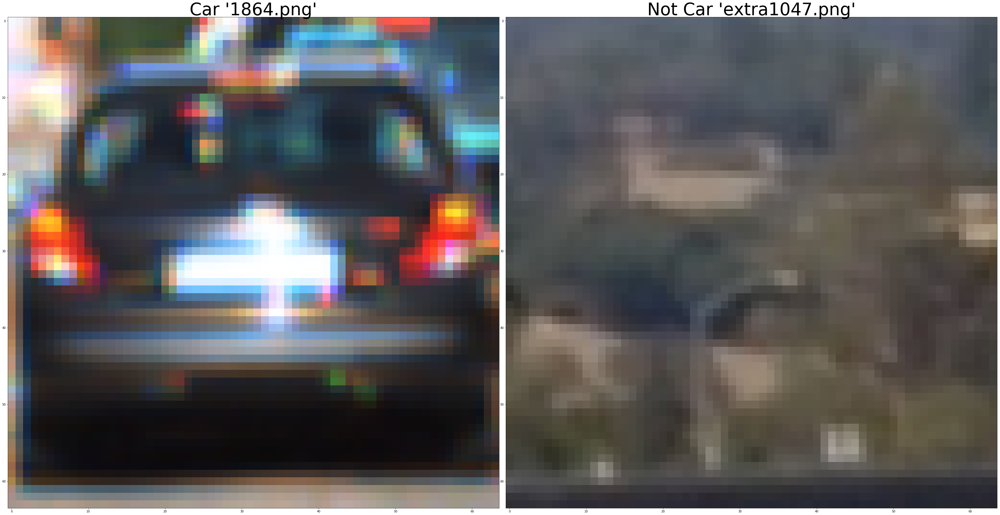

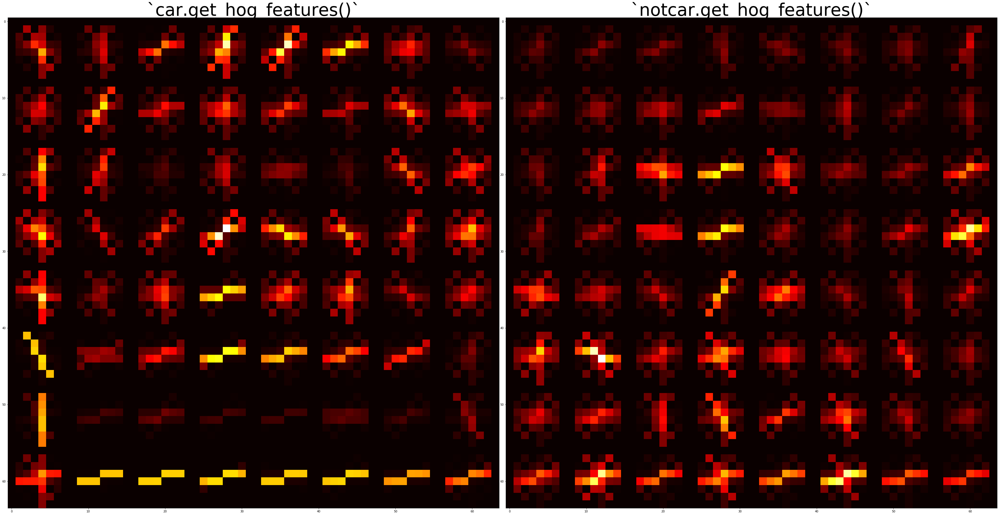

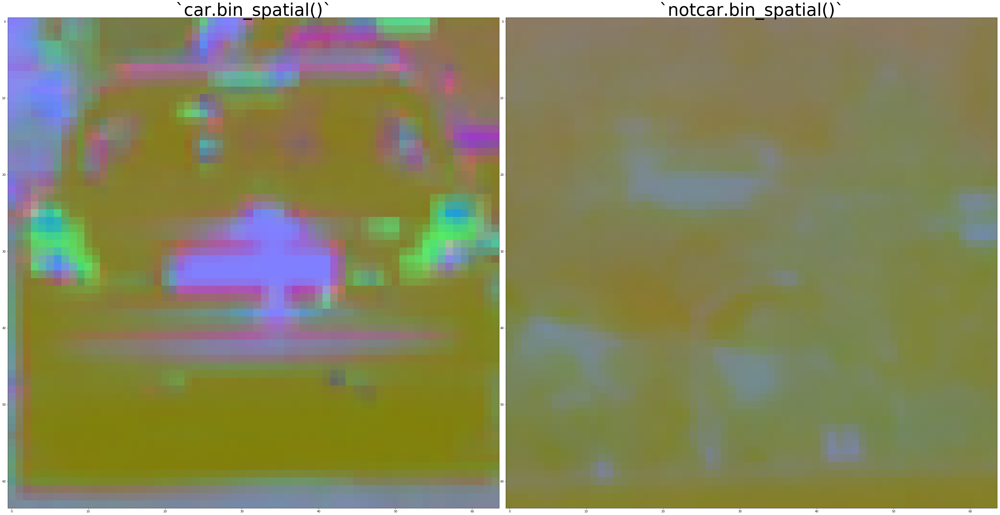

In [7]:
i_car = 509 # np.random.randint(0, len(cars))
i_notcar = 3003 # np.random.randint(0, len(notcars))

car = cars[i_car]
notcar = notcars[i_notcar]

car_name = '../../Repos/udacity_car_nanodegree_project05/features/car_{0}'.format(os.path.splitext(os.path.basename(car.imgpath))[0])
notcar_name = '../../Repos/udacity_car_nanodegree_project05/features/notcar_{0}'.format(os.path.splitext(os.path.basename(notcar.imgpath))[0])

show_images((car.img0, "Car '{0}'".format(os.path.basename(car.imgpath)), car_name + '.png'),
            (notcar.img0, "Not Car '{0}'".format(os.path.basename(notcar.imgpath)), notcar_name + '.png'))

show_images((car.get_hog_features(car.img, visualize=True)[1][0], '`car.get_hog_features()`', car_name + '_HOG.png'),
            (notcar.get_hog_features(notcar.img, visualize=True)[1][0], '`notcar.get_hog_features()`', notcar_name + '_HOG.png'))

show_images((car.bin_spatial(car.img, visualize=True)[1], '`car.bin_spatial()`', car_name + '_binned.png'),
            (notcar.bin_spatial(notcar.img, visualize=True)[1], '`notcar.bin_spatial()`', notcar_name + '_binned.png'))

## 3. Train a classifier

In [8]:
# Split up data into randomized training and test sets
rand_state = 43
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)

### Linear SVM with `C = 1`

In [9]:
print('Feature vector length:', len(X_train[0]))

# Use a linear SVC
svc = LinearSVC()

# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print('Time to train SVC = {0:.2f} seconds'.format(t2-t))

# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

Feature vector length: 8460
Time to train SVC = 6.82 seconds
Test Accuracy of SVC =  0.9916


### Use `GridSearchCV`

In [10]:
if False:
    parameters = {'kernel':('linear', 'rbf'), 'C':[1, 10]}
    parameters = {'C':[1, 10]}

    t=time.time()
    #svr = SVC()
    svr = LinearSVC()
    svc = GridSearchCV(svr, parameters)
    svc.fit(X_train, y_train)
    t2 = time.time()
    print('Time to train SVC = {0:.2f} seconds'.format(t2-t))

    # Check the score of the SVC
    print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
    print(svc.best_params_)

## 4. Use sliding windows to find cars in images

### Parameters used for detecting cars in an image

In [11]:
find_kwargs = {'scales':[1.5, 2], 'min_rows':[380, 412], 'max_rows':[500, 660], 'cells_per_steps':[1, 1],
               'svc':svc, 'X_scaler':X_scaler}

### Display the search windows


Window length = 96.0
Window overlap = 12.0


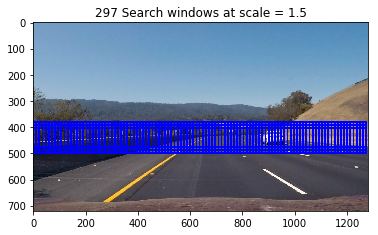


Window length = 128
Window overlap = 16.0


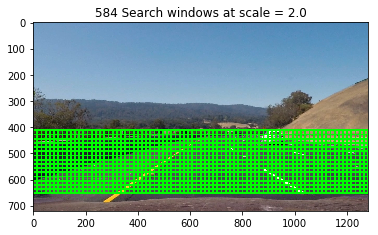


Total windows searched over all scales = 881


In [12]:
t0 = Frame(imgpath=test_images[2], **frame_kwargs)
bbox_all = []

total_windows = 0
for i, (scale, min_row, max_row, cells_per_step) in enumerate(zip(find_kwargs['scales'], find_kwargs['min_rows'],
                                                  find_kwargs['max_rows'], find_kwargs['cells_per_steps'])):
    t0.scale = scale
    t0.min_row = min_row
    t0.max_row = max_row
    t0.hog_cells_per_step = cells_per_step
    
    bbox_list = t0.get_windows()
    bbox_list0 = [x[0] for x in bbox_list]
    bbox_all += bbox_list0
    total_windows += len(bbox_list0)
    
    color = [0,0,0]
    color[i] = 255
    img = t0.draw_bboxes(bbox_list0, color=color)
    cv2.imwrite('../../Repos/udacity_car_nanodegree_project05/windows/windows_{0}.png'.format(scale), img)
    print('\nWindow length = {0}'.format(64*scale))
    print('Window overlap = {0}'.format(64*scale * cells_per_step/8))
    imshow_cv2(img)
    plt.title('{0} Search windows at scale = {1:.1f}'.format(len(bbox_list0), scale))
    plt.show()
    
print('\nTotal windows searched over all scales = {0}'.format(total_windows))

img = t0.draw_bboxes(bbox_all, color=color)

### Show some results

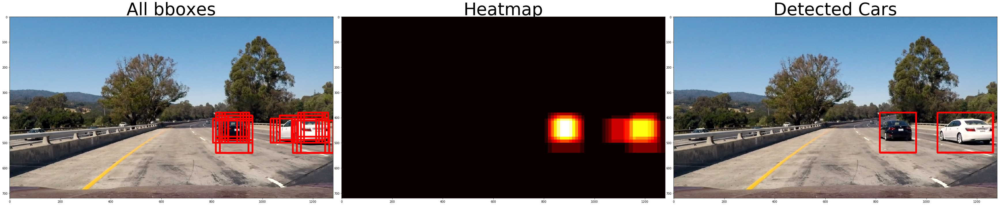

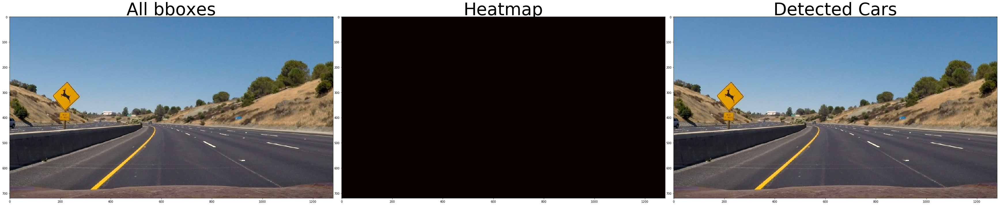

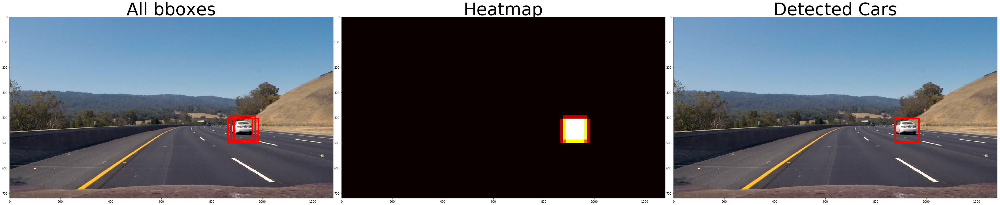

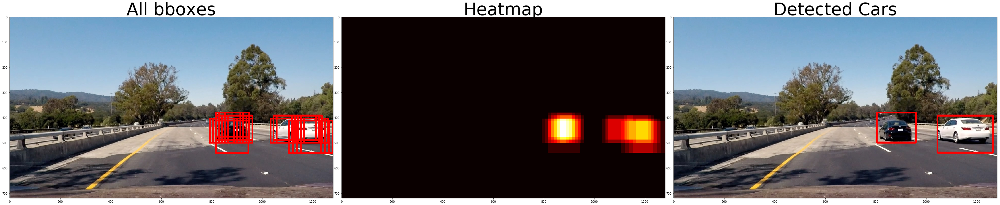

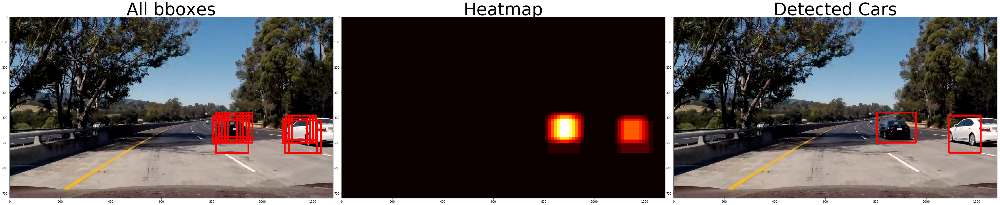

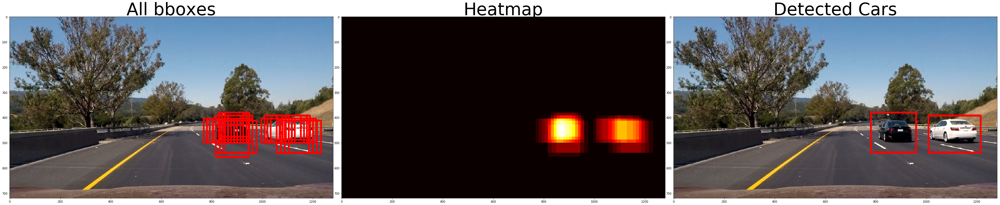

In [13]:
for t in test_images:
    f = Frame(imgpath=t, **frame_kwargs)
    
    all_bboxes = f.draw_bboxes(f.get_bboxes(**find_kwargs))
    f.get_heatmap(**find_kwargs)
    heatmap = f.heatmap
    cars = f.find_cars(**find_kwargs)
    
    fname = '../../Repos/udacity_car_nanodegree_project05/results/' + os.path.splitext(os.path.basename(f.imgpath))[0]
    show_images((all_bboxes, 'All bboxes', fname + '.png'),
                (heatmap, 'Heatmap', fname + '_heatmap.png'),
                (cars, 'Detected Cars', fname + '_cars.png'))

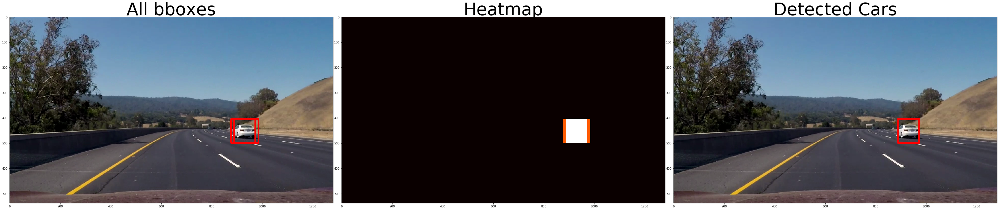

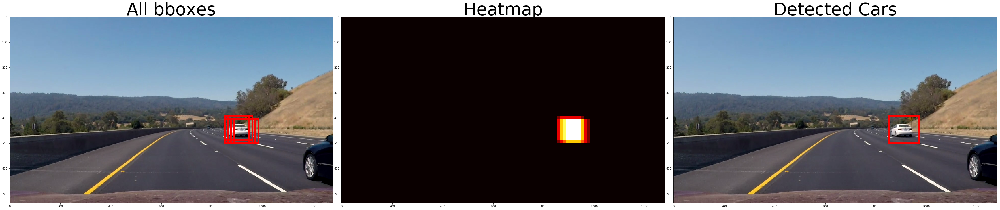

In [14]:
for s in snapshots:
    f = Frame(imgpath=s, **frame_kwargs)
    
    all_bboxes = f.draw_bboxes(f.get_bboxes(**find_kwargs))
    f.get_heatmap(**find_kwargs)
    heatmap = f.heatmap
    cars = f.find_cars(**find_kwargs)
    
    show_images((all_bboxes, 'All bboxes'), (heatmap, 'Heatmap'), (cars, 'Detected Cars'))

## 5. Detect vehicles in a video

### Load the video frames

In [15]:
clip = '../../Repos/CarND-Vehicle-Detection/project_video.mp4'

# use the previous `n` frames to help detect cars
n = 0

# https://tobilehman.com/blog/2013/01/20/extract-array-of-frames-from-mp4-using-python-opencv-bindings/
vidcap = cv2.VideoCapture(clip)
count = 0
frames_list = []
success = True

while success:
    success, img = vidcap.read()
    
    if success:
        if n > 0 and count > 0:
            prev = frames_list[max(count-n, 0):count][::-1]
        else:
            prev = None
            
        f = Frame(img, prev=prev, **frame_kwargs)

        frames_list.append(f)
        
    if cv2.waitKey(10) == 27:                     # exit if Escape is hit
        break

### Find the vehicles and output a video

In [16]:
output = '../../Projects/Project_05/project_video_cars.mp4'

clip = ImageSequenceClip([f.find_cars(**find_kwargs)[:,:,::-1] for f in frames_list], fps=25)
clip.write_videofile(output)

[MoviePy] >>>> Building video ../../Projects/Project_05/project_video_cars.mp4
[MoviePy] Writing video ../../Projects/Project_05/project_video_cars.mp4


100%|██████████| 1257/1257 [01:03<00:00,  6.93it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../../Projects/Project_05/project_video_cars.mp4 

